In [1]:
import pandas as pd
import numpy as np

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
# urlAp = '/content/drive/MyDrive/01INTEGRADOR/respuestas_analisis2.csv'
# datos = pd.read_csv(urlAp)

In [4]:
datos = pd.read_csv('respuestas_analisis2.csv')

In [5]:
datos.head()

,1,C,4241,41232,807
0,1,C,4241,41232,807
1,1,C,4241,41232,807
2,1,C,4241,41232,807
3,1,C,4241,41232,807
4,1,C,4241,41232,807


In [6]:
datos.columns = [
"question_id",
"value_item",
"teacher_id",
"student_id",
"course_id"
]

datos.head()

,question_id,value_item,teacher_id,student_id,course_id
0,1,C,4241,41232,807
1,1,C,4241,41232,807
2,1,C,4241,41232,807
3,1,C,4241,41232,807
4,1,C,4241,41232,807


In [7]:
datos.info()

<class 'pandas.DataFrame'>
RangeIndex: 19657623 entries, 0 to 19657622
Data columns (total 5 columns):
 #   Column       Dtype
---  ------       -----
 0   question_id  int64
 1   value_item   str  
 2   teacher_id   int64
 3   student_id   int64
 4   course_id    int64
dtypes: int64(4), str(1)
memory usage: 768.6 MB


In [8]:
datos["value_item"].unique()

<ArrowStringArray>
['C', 'E', 'B', 'A', 'D']
Length: 5, dtype: str

In [9]:
conversion = {
"A":5,
"B":4,
"C":3,
"D":2,
"E":1
}

datos["valor"] = datos["value_item"].map(conversion)

datos.head()

,question_id,value_item,teacher_id,student_id,course_id,valor
0,1,C,4241,41232,807,3
1,1,C,4241,41232,807,3
2,1,C,4241,41232,807,3
3,1,C,4241,41232,807,3
4,1,C,4241,41232,807,3


In [10]:
#docente + estudiante + materia
#agrupar encuestas
encuestas = datos.groupby(["teacher_id","student_id","course_id"])

In [11]:
for clave, grupo in encuestas:
    print("Encuesta:", clave)
    print("Respuestas:", grupo["valor"].tolist())
    break

Encuesta: (1, 5000, 1221)
Respuestas: [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


In [12]:
def analizar_encuesta(respuestas):

    promedio = sum(respuestas)/len(respuestas)
    variabilidad = len(set(respuestas))

    from collections import Counter
    conteo = Counter(respuestas)

    uniformidad = conteo.most_common(1)[0][1] / len(respuestas)

    if uniformidad > 0.8:
        resultado = "Encuesta sospechosa"

    elif promedio > 4.5 and variabilidad <= 2:
        resultado = "Posible sesgo positivo"

    elif variabilidad >= 3:
        resultado = "Encuesta confiable"

    else:
        resultado = "Encuesta dudosa"

    return promedio, variabilidad, uniformidad, resultado

In [13]:
for clave, grupo in encuestas:

    respuestas = grupo["valor"].tolist()

    promedio, variabilidad, uniformidad, resultado = analizar_encuesta(respuestas)

    print("Encuesta:", clave)
    print("Promedio:", promedio)
    print("Variabilidad:", variabilidad)
    print("Uniformidad:", uniformidad)
    print("Resultado:", resultado)
    print("----------------------")

Encuesta: (1, 5000, 1221)
Promedio: 4.785714285714286
Variabilidad: 2
Uniformidad: 0.7857142857142857
Resultado: Posible sesgo positivo
----------------------
Encuesta: (1, 5012, 212)
Promedio: 2.4285714285714284
Variabilidad: 4
Uniformidad: 0.5
Resultado: Encuesta confiable
----------------------
Encuesta: (1, 5012, 213)
Promedio: 2.9285714285714284
Variabilidad: 3
Uniformidad: 0.6428571428571429
Resultado: Encuesta confiable
----------------------
Encuesta: (1, 5031, 513)
Promedio: 4.857142857142857
Variabilidad: 2
Uniformidad: 0.8571428571428571
Resultado: Encuesta sospechosa
----------------------
Encuesta: (1, 5038, 28)
Promedio: 5.0
Variabilidad: 1
Uniformidad: 1.0
Resultado: Encuesta sospechosa
----------------------
Encuesta: (1, 5129, 133)
Promedio: 5.0
Variabilidad: 1
Uniformidad: 1.0
Resultado: Encuesta sospechosa
----------------------
Encuesta: (1, 5296, 842)
Promedio: 4.785714285714286
Variabilidad: 2
Uniformidad: 0.7857142857142857
Resultado: Posible sesgo positivo
-----

KeyboardInterrupt: 

In [ ]:
resultados_encuestas = []

for clave, grupo in encuestas:
    teacher_id, student_id, course_id = clave
    respuestas = grupo["valor"].tolist()

    promedio, variabilidad, uniformidad, resultado = analizar_encuesta(respuestas)

    resultados_encuestas.append({
        "teacher_id": teacher_id,
        "student_id": student_id,
        "course_id": course_id,
        "promedio": promedio,
        "variabilidad": variabilidad,
        "uniformidad": uniformidad,
        "resultado": resultado
    })

resultados_df = pd.DataFrame(resultados_encuestas)
print(resultados_df.head())

   teacher_id  student_id  course_id  promedio  variabilidad  uniformidad  \
0           1        5000       1221  4.785714             2     0.785714   
1           1        5012        212  2.428571             4     0.500000   
2           1        5012        213  2.928571             3     0.642857   
3           1        5031        513  4.857143             2     0.857143   
4           1        5038         28  5.000000             1     1.000000   

                resultado  
0  Posible sesgo positivo  
1      Encuesta confiable  
2      Encuesta confiable  
3     Encuesta sospechosa  
4     Encuesta sospechosa  


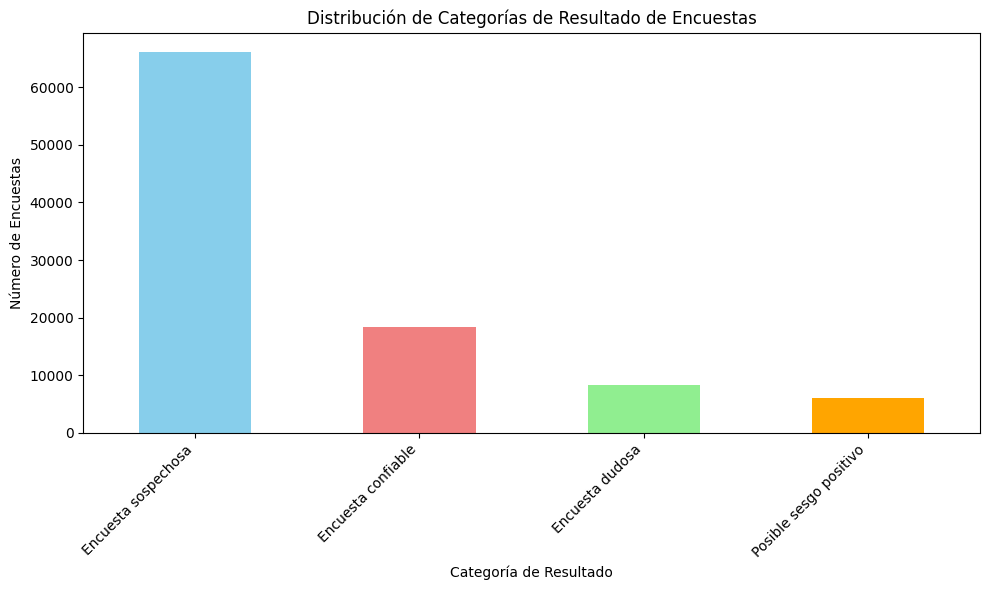

In [ ]:
import matplotlib.pyplot as plt

resultado_counts = resultados_df['resultado'].value_counts()

plt.figure(figsize=(10, 6))
resultado_counts.plot(kind='bar', color=['skyblue', 'lightcoral', 'lightgreen', 'orange'])
plt.title('Distribución de Categorías de Resultado de Encuestas')
plt.xlabel('Categoría de Resultado')
plt.ylabel('Número de Encuestas')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
from scipy.stats import chisquare

# Las frecuencias observadas ya están en resultado_counts
observed_frequencies = resultado_counts.values

# Número total de observaciones
total_observations = observed_frequencies.sum()

# Número de categorías
num_categories = len(observed_frequencies)

# Frecuencias esperadas asumiendo una distribución uniforme
expected_frequencies = np.full(num_categories, total_observations / num_categories)

print("Frecuencias Observadas:", observed_frequencies)
print("Frecuencias Esperadas (distribución uniforme):", expected_frequencies)

Frecuencias Observadas: [66148 18364  8249  6060]
Frecuencias Esperadas (distribución uniforme): [24705.25 24705.25 24705.25 24705.25]


### Paso 3 - Calcular el Estadístico (X²)

Ahora, calcularemos el estadístico de prueba Chi-cuadrado. Este valor nos dice qué tan grande es la diferencia entre lo que observamos y lo que esperaríamos si la hipótesis nula fuera cierta.

### Paso 4 - Grados de Libertad (gl) y valores críticos

Los **grados de libertad (gl)** son un valor que depende del número de categorías y se utiliza para interpretar el estadístico Chi-cuadrado. Para esta prueba de bondad de ajuste, se calcula como `(número de categorías - 1)`.

También necesitamos un **valor crítico**, que es un umbral. Si nuestro estadístico Chi-cuadrado calculado es mayor que este valor crítico (para un nivel de significancia de 0.05, que es un 5% de probabilidad de error), entonces podemos rechazar la hipótesis nula.

In [ ]:
# Calcular el estadístico Chi-cuadrado y el valor p
chi2_statistic, p_value = chisquare(f_obs=observed_frequencies, f_exp=expected_frequencies)

# Grados de libertad
degrees_of_freedom = num_categories - 1

# Nivel de significancia (alpha)
alpha = 0.05

# Valor crítico
from scipy.stats import chi2
critical_value = chi2.ppf(1 - alpha, degrees_of_freedom)

print(f"Estadístico Chi-cuadrado (X²): {chi2_statistic:.4f}")
print(f"Grados de Libertad (gl): {degrees_of_freedom}")
print(f"Valor Crítico (alpha={alpha}): {critical_value:.4f}")

Estadístico Chi-cuadrado (X²): 96180.6292
Grados de Libertad (gl): 3
Valor Crítico (alpha=0.05): 7.8147


### Paso 5 - Grados de Libertad (gl) y valor-p

Aquí se muestran los grados de libertad y el **valor p** calculado. El valor p es la probabilidad de obtener un resultado tan extremo (o más extremo) como el que observamos, si la hipótesis nula fuera verdadera. Un valor p pequeño (generalmente menor a 0.05) es evidencia para rechazar la hipótesis nula.

### 1. Distribución de las Respuestas Originales (`value_item`)

Este gráfico de barras muestra la frecuencia de cada opción de respuesta original (A, B, C, D, E). Nos da una idea inicial de cómo los estudiantes calificaron antes de cualquier procesamiento.

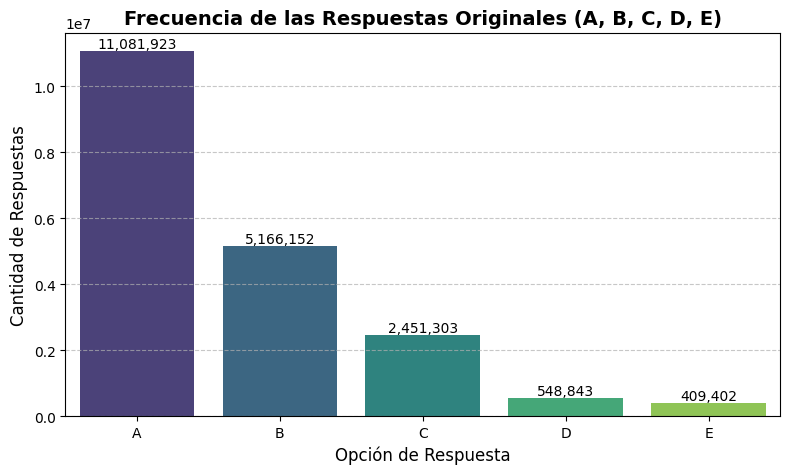

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Obtener el conteo de cada 'value_item' original
value_item_counts = datos['value_item'].value_counts().sort_index()

plt.figure(figsize=(8, 5))
sns.barplot(x=value_item_counts.index, y=value_item_counts.values, palette='viridis', hue=value_item_counts.index, legend=False)
plt.title('Frecuencia de las Respuestas Originales (A, B, C, D, E)', fontsize=14, fontweight='bold')
plt.xlabel('Opción de Respuesta', fontsize=12)
plt.ylabel('Cantidad de Respuestas', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Añadir etiquetas de valores a las barras
for index, value in enumerate(value_item_counts.values):
    plt.text(index, value, f'{value:,}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


### 2. Distribución de las Respuestas Convertidas (`valor`)

Aquí vemos la distribución de las respuestas después de convertirlas a valores numéricos (1 a 5). Esto nos muestra cómo se distribuyen los 'puntos' asignados por los estudiantes.

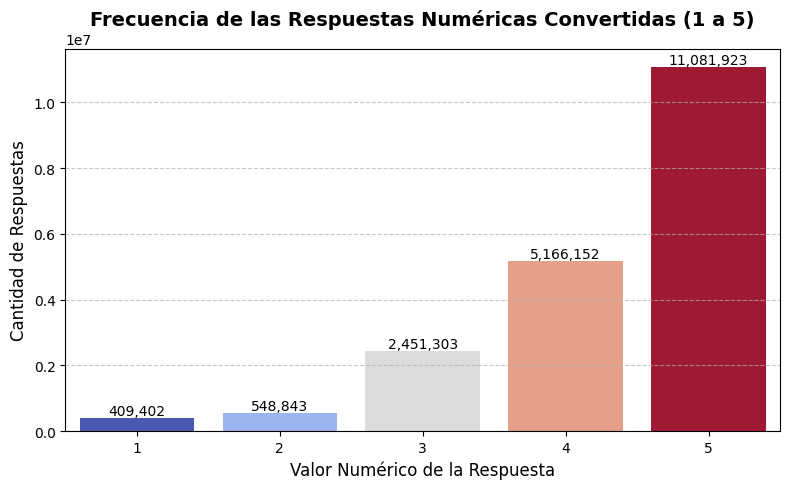

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Obtener el conteo de cada 'valor' numérico
valor_counts = datos['valor'].value_counts().sort_index()

plt.figure(figsize=(8, 5))
sns.barplot(x=valor_counts.index, y=valor_counts.values, palette='coolwarm', hue=valor_counts.index, legend=False)
plt.title('Frecuencia de las Respuestas Numéricas Convertidas (1 a 5)', fontsize=14, fontweight='bold')
plt.xlabel('Valor Numérico de la Respuesta', fontsize=12)
plt.ylabel('Cantidad de Respuestas', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Añadir etiquetas de valores a las barras
for index, value in enumerate(valor_counts.values):
    plt.text(index, value, f'{value:,}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


### 3. Distribución del Promedio de las Encuestas (`promedio`)

Este histograma muestra cómo se agrupan los promedios de 'valor' de todas las encuestas individuales. Podemos ver si la mayoría de las encuestas tienen promedios altos, bajos o están en el medio.

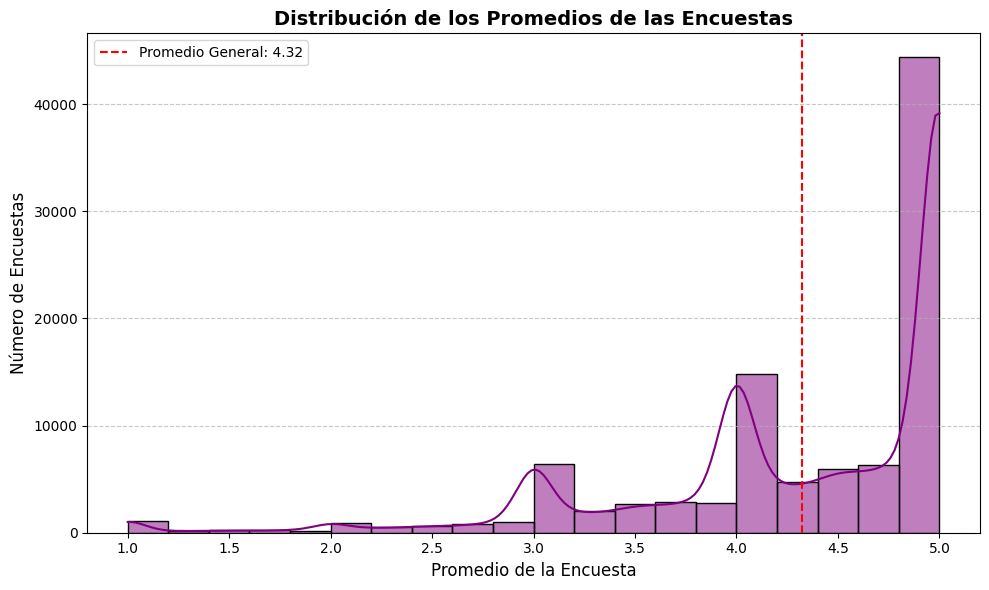

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(resultados_df['promedio'], bins=20, kde=True, color='purple')
plt.title('Distribución de los Promedios de las Encuestas', fontsize=14, fontweight='bold')
plt.xlabel('Promedio de la Encuesta', fontsize=12)
plt.ylabel('Número de Encuestas', fontsize=12)
plt.axvline(resultados_df['promedio'].mean(), color='red', linestyle='--', label=f'Promedio General: {resultados_df["promedio"].mean():.2f}')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


### 4. Distribución de la Variabilidad de las Respuestas (`variabilidad`)

Este gráfico muestra cuántas opciones diferentes de respuesta (1 a 5) usó cada estudiante en sus encuestas. Una baja variabilidad (ej: solo una o dos opciones) puede indicar respuestas poco reflexivas.

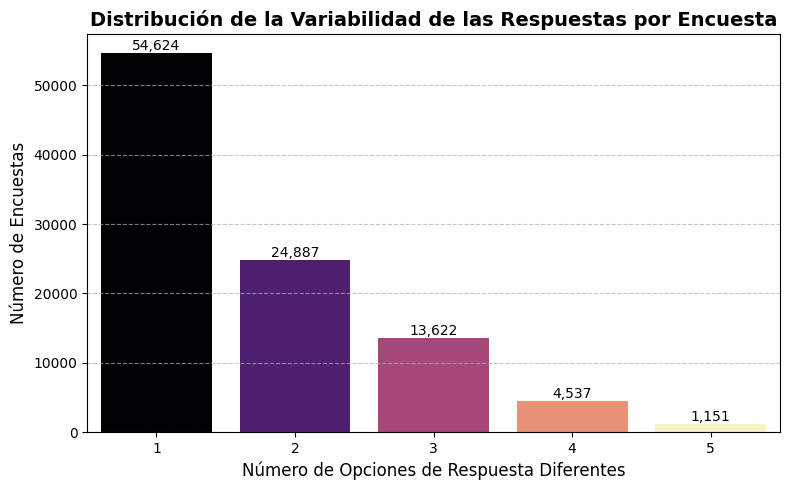

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.countplot(x=resultados_df['variabilidad'], palette='magma', hue=resultados_df['variabilidad'], legend=False)
plt.title('Distribución de la Variabilidad de las Respuestas por Encuesta', fontsize=14, fontweight='bold')
plt.xlabel('Número de Opciones de Respuesta Diferentes', fontsize=12)
plt.ylabel('Número de Encuestas', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Añadir etiquetas de valores a las barras
for container in plt.gca().containers:
    plt.bar_label(container, fmt='{:,.0f}', fontsize=10)

plt.tight_layout()
plt.show()


### 5. Distribución de la Uniformidad de las Respuestas (`uniformidad`)

Este histograma muestra qué tan 'uniformes' son las respuestas dentro de cada encuesta individual. Un valor alto (cercano a 1) indica que la mayoría de las respuestas son idénticas, lo cual es un indicador clave de 'Encuesta sospechosa'.

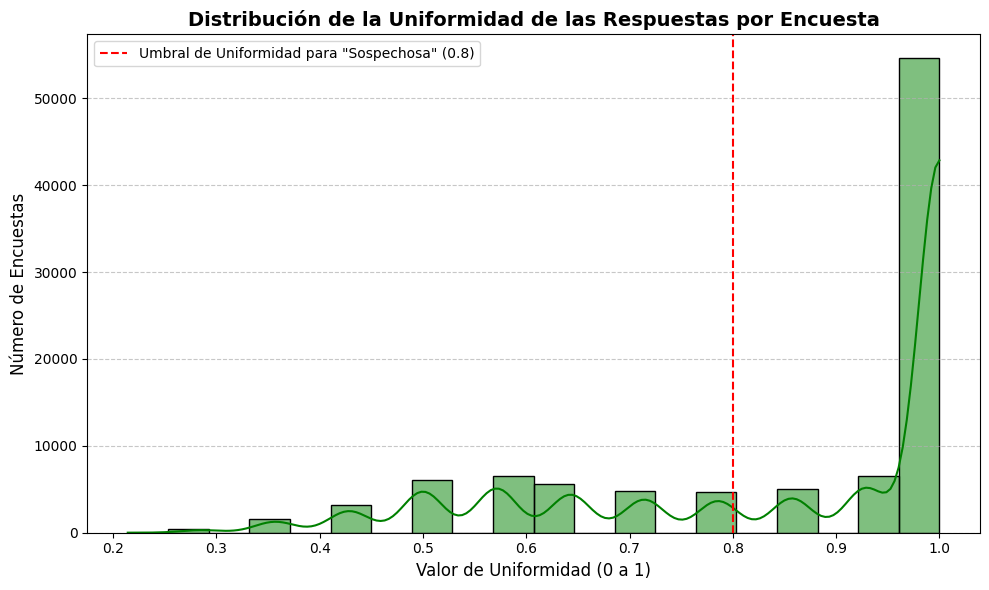

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(resultados_df['uniformidad'], bins=20, kde=True, color='green')
plt.title('Distribución de la Uniformidad de las Respuestas por Encuesta', fontsize=14, fontweight='bold')
plt.xlabel('Valor de Uniformidad (0 a 1)', fontsize=12)
plt.ylabel('Número de Encuestas', fontsize=12)
plt.axvline(0.8, color='red', linestyle='--', label='Umbral de Uniformidad para "Sospechosa" (0.8)')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
print(f"Grados de Libertad (gl): {degrees_of_freedom}")
print(f"Valor p: {p_value:.4e}") # Mostrar el valor p en notación científica debido a su pequeño tamaño

Grados de Libertad (gl): 3
Valor p: 0.0000e+00


### Paso 6 - Decisión y Conclusión

Finalmente, comparamos el valor p con nuestro nivel de significancia (alpha) y el estadístico Chi-cuadrado con el valor crítico para tomar una decisión sobre la hipótesis nula y sacar una conclusión clara sobre la distribución de tus encuestas.

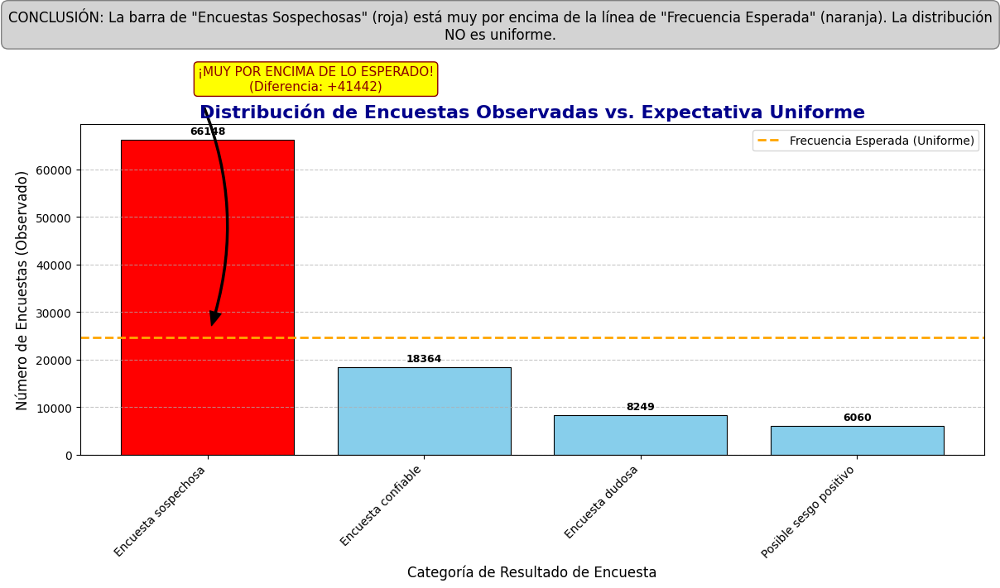

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Datos ya calculados (asumiendo que resultado_counts y expected_frequencies están disponibles)
observed_frequencies = resultado_counts.values
expected_frequency_per_category = expected_frequencies[0] # Todas las esperadas son iguales
categories = resultado_counts.index

fig, ax = plt.subplots(figsize=(12, 7))

# Definir colores para las barras, destacando "Encuesta sospechosa"
sospechosa_index = list(categories).index('Encuesta sospechosa')
colors = ['skyblue'] * len(categories)
colors[sospechosa_index] = 'red' # Color fuerte para la observada sospechosa

# Crear el gráfico de barras solo con las frecuencias observadas
ax.bar(categories, observed_frequencies, color=colors, edgecolor='black', linewidth=0.8)

# Añadir la línea horizontal de la frecuencia esperada
ax.axhline(y=expected_frequency_per_category, color='orange', linestyle='--', linewidth=2, label='Frecuencia Esperada (Uniforme)')

# Añadir texto, título y etiquetas de eje
ax.set_xlabel('Categoría de Resultado de Encuesta', fontsize=12)
ax.set_ylabel('Número de Encuestas (Observado)', fontsize=12)
ax.set_title('Distribución de Encuestas Observadas vs. Expectativa Uniforme', fontsize=16, fontweight='bold', color='darkblue')
ax.set_xticks(np.arange(len(categories)))
ax.set_xticklabels(categories, rotation=45, ha='right', fontsize=10)
ax.legend(fontsize=10)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Función para añadir etiquetas de valores a las barras
def autolabel(rects):
    for i, rect in enumerate(rects):
        height = rect.get_height()
        ax.annotate(f'{int(height)}',  # Formatear como entero
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 puntos de desplazamiento vertical
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=9, fontweight='bold')

# Etiquetar las barras
autolabel(ax.patches) # 'ax.patches' contiene las barras creadas por ax.bar

# Anotación específica para la categoría "Encuesta sospechosa"
sospechosa_observed_height = observed_frequencies[sospechosa_index]

# Texto y flecha para la desviación de "Encuesta Sospechosa"
if sospechosa_observed_height > expected_frequency_per_category:
    diff_value = int(sospechosa_observed_height - expected_frequency_per_category)
    ax.annotate(
        f'¡MUY POR ENCIMA DE LO ESPERADO!\n(Diferencia: +{diff_value})',
        xy=(sospechosa_index, expected_frequency_per_category), # Origen de la flecha en la línea esperada
        xytext=(sospechosa_index + 0.5, sospechosa_observed_height + 10000), # Destino del texto (ajustado para que no se superponga)
        arrowprops=dict(facecolor='black', shrink=0.05, width=1.5, headwidth=10, connectionstyle="arc3,rad=-0.2"),
        fontsize=11, color='darkred', ha='center', va='bottom',
        bbox=dict(boxstyle="round,pad=0.3", fc="yellow", ec="darkred", lw=1)
    )

# Texto resumen general en el gráfico
plt.figtext(0.5, 0.96, 'CONCLUSIÓN: La barra de "Encuestas Sospechosas" (roja) está muy por encima de la línea de "Frecuencia Esperada" (naranja). La distribución NO es uniforme.',
            wrap=True, horizontalalignment='center', fontsize=12,
            bbox=dict(boxstyle="round,pad=0.5", fc="lightgray", ec="gray", lw=1))

plt.tight_layout(rect=[0, 0, 1, 0.95]) # Ajusta el layout para dar espacio al figtext superior
plt.show()


### Resumen de Resultados y Conclusión Final

**Estadístico Chi-cuadrado (X²):** 96180.63

*   Este valor es muy alto, indicando una gran diferencia entre lo que observamos y lo que esperaríamos si los resultados de las encuestas fueran uniformes.

**Grados de Libertad (gl):** 3

*   Este valor se usa para consultar las tablas estadísticas y comparar nuestro Chi-cuadrado.

**Valor Crítico (alpha=0.05):** 7.81

*   Este es nuestro umbral. Si nuestro X² es mayor que 7.81, rechazamos la hipótesis nula.

**Valor p:** 0.0000e+00 (prácticamente cero)

*   Un valor p tan pequeño significa que la probabilidad de ver una distribución como la nuestra (o más extrema) *por puro azar*, si las encuestas fueran realmente uniformes, es casi nula.

### **Decisión:** Rechazamos la Hipótesis Nula (H0).

### **Conclusión:**

Basándonos en estos resultados, podemos afirmar con **alta confianza estadística** que **la distribución observada de las categorías de resultados de la encuesta es significativamente diferente de una distribución uniforme**.

**Esto significa que:**

*   **No todas las categorías de resultados de encuestas aparecen con la misma frecuencia.** Como se puede ver claramente en el gráfico de barras, la categoría **'Encuesta sospechosa'** es predominante, apareciendo con una frecuencia *muchísimo mayor* a la esperada en una distribución uniforme (barra azul vs. barra roja clara).
*   La idea de que "en su mayoría las respuestas son sospechosas" está **fuertemente respaldada** por estos datos y este análisis estadístico.
*   La hipótesis de que "las respuestas de las encuestas no son sospechosas y son confiables" es **refutada**, ya que la proporción de encuestas sospechosas es significativamente alta y la distribución no es uniforme.

El gráfico de barras superior ilustra esta conclusión mostrando cómo las "Frecuencias Observadas" (barras azules) se desvían drásticamente de las "Frecuencias Esperadas (Uniforme)" (barras rojo claro), especialmente para la categoría de "Encuesta sospechosa".


In [ ]:
print(f"Nivel de Significancia (alpha): {alpha}")
print(f"Valor p: {p_value:.4e}")

if p_value < alpha:
    print("Decisión: Se rechaza la Hipótesis Nula (H0).")
    print("Conclusión: La distribución observada de las categorías de resultados de la encuesta es significativamente diferente de una distribución uniforme.")
    print("Esto sugiere que las proporciones de 'Encuesta sospechosa', 'Encuesta confiable', etc., no son iguales.")
else:
    print("Decisión: No se rechaza la Hipótesis Nula (H0).")
    print("Conclusión: No hay evidencia suficiente para concluir que la distribución observada de las categorías de resultados de la encuesta sea significativamente diferente de una distribución uniforme.")

# Adicionalmente, comparando el estadístico chi2 con el valor crítico:
if chi2_statistic > critical_value:
    print(f"Además, dado que X² ({chi2_statistic:.2f}) > Valor Crítico ({critical_value:.2f}), rechazamos H0.")
else:
    print(f"Además, dado que X² ({chi2_statistic:.2f}) <= Valor Crítico ({critical_value:.2f}), no rechazamos H0.")

Nivel de Significancia (alpha): 0.05
Valor p: 0.0000e+00
Decisión: Se rechaza la Hipótesis Nula (H0).
Conclusión: La distribución observada de las categorías de resultados de la encuesta es significativamente diferente de una distribución uniforme.
Esto sugiere que las proporciones de 'Encuesta sospechosa', 'Encuesta confiable', etc., no son iguales.
Además, dado que X² (96180.63) > Valor Crítico (7.81), rechazamos H0.


Entrenamiento de modelo con regrecion lineal

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

X = resultados_df[["variabilidad", "uniformidad"]]
y = resultados_df["promedio"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

modelo_regresion = LinearRegression()
modelo_regresion.fit(X_train, y_train)

print("Modelo de Regresión Lineal entrenado correctamente")

Modelo de Regresión Lineal entrenado correctamente


In [ ]:
y_pred = modelo_regresion.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("MAE:", round(mae, 4))
print("MSE:", round(mse, 4))
print("RMSE:", round(rmse, 4))
print("R²:", round(r2, 4))

MAE: 0.596
MSE: 0.6066
RMSE: 0.7789
R²: 0.1487


In [ ]:
docente_id = 4241

datos_docente = resultados_df[resultados_df["teacher_id"] == docente_id]

if len(datos_docente) == 0:
    print("No existen datos para ese docente")
else:
    X_docente = datos_docente[["variabilidad", "uniformidad"]]
    predicciones = modelo_regresion.predict(X_docente)

    datos_docente = datos_docente.copy()
    datos_docente["promedio_predicho"] = predicciones

    print("Predicción para el docente:", docente_id)
    display(datos_docente[[
        "teacher_id",
        "student_id",
        "course_id",
        "promedio",
        "promedio_predicho",
        "resultado"
    ]].head(20))

Predicción para el docente: 4241


,teacher_id,student_id,course_id,promedio,promedio_predicho,resultado
54034,4241,5606,807,1.000000,4.570365,Encuesta sospechosa
54035,4241,5964,807,3.857143,4.249049,Encuesta sospechosa
54036,4241,6494,807,3.000000,3.222592,Encuesta confiable
54037,4241,6888,807,5.000000,4.570365,Encuesta sospechosa
54038,4241,6901,799,5.000000,4.570365,Encuesta sospechosa
54039,4241,6961,807,4.214286,4.217794,Encuesta dudosa
54040,4241,7731,799,3.071429,4.280304,Encuesta sospechosa
54041,4241,8257,807,2.928571,3.512653,Encuesta confiable
54042,4241,9081,807,3.214286,4.217794,Encuesta dudosa
54043,4241,9122,807,4.714286,4.186539,Posible sesgo positivo


In [ ]:
promedio_futuro = datos_docente["promedio_predicho"].mean()

print(f"Para el docente {docente_id}, el modelo espera un promedio estimado aproximado de: {promedio_futuro:.2f}/5")

if promedio_futuro >= 4.5:
    print("Interpretación: Se espera un desempeño excelente.")
elif promedio_futuro >= 4:
    print("Interpretación: Se espera un desempeño bueno.")
elif promedio_futuro >= 3:
    print("Interpretación: Se espera un desempeño regular.")
else:
    print("Interpretación: Se espera un desempeño bajo o en riesgo.")

Para el docente 4241, el modelo espera un promedio estimado aproximado de: 4.11/5
Interpretación: Se espera un desempeño bueno.


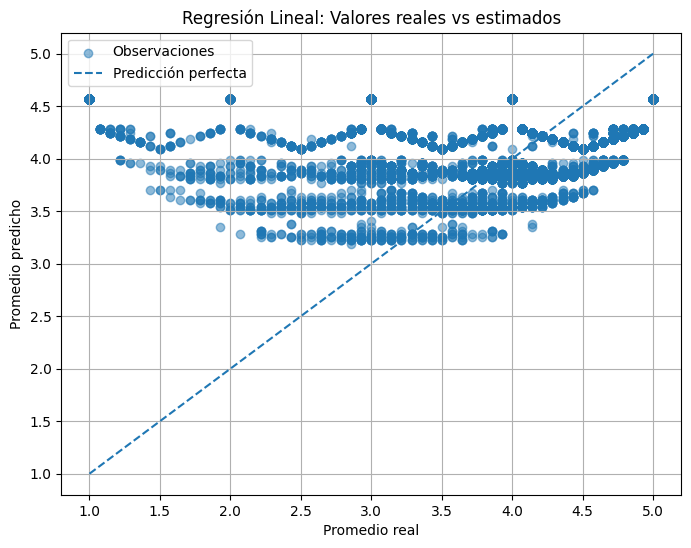

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

plt.scatter(
    y_test,
    y_pred,
    alpha=0.5,
    label="Observaciones"
)

plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    linestyle="--",
    label="Predicción perfecta"
)

plt.xlabel("Promedio real")
plt.ylabel("Promedio predicho")
plt.title("Regresión Lineal: Valores reales vs estimados")
plt.legend()
plt.grid(True)

plt.show()

"Se implementó un modelo de regresión lineal para estimar el promedio esperado de futuras evaluaciones docentes a partir de indicadores obtenidos de encuestas históricas, como la variabilidad y uniformidad de las respuestas."

In [ ]:
import joblib

joblib.dump(modelo_regresion, "modelo_regresion_docentes.pkl")

print("Modelo guardado")

Modelo guardado
